## Importing Libraries

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf


import sys
!{sys.executable} -m pip install git+https://github.com/nottombrown/imagenet_stubs
sys.path.append("..")

%matplotlib inline

tf.compat.v1.disable_eager_execution()

import imagenet_stubs
import numpy as np
import tensorflow.keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
import tensorflow.keras.backend as k
from matplotlib import pyplot as plt
from IPython.display import clear_output, Image, display
import cv2

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import HopSkipJump
from art.utils import to_categorical

from PIL import Image
import matplotlib.image as mpimg

  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-oyj8ixvt
  Running command git clone --filter=blob:none -q https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-oyj8ixvt
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done


/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/romi/anaconda3/envs/mhashir/lib/python3.6/site-packages/art/estimators/certification/__init__.py:28: UserWarning: PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality
  warnings.warn("PyTorch not found. Not importing DeepZ or Interval Bound Propagation functionality")


### Part 1: Getting Similarity Score of Pairs of Images

In [ ]:
def sift_feature_matching(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0

    return num_matches

In [ ]:
def match(img1_path, img2_path, threshold=0.7, ransac_threshold=3.0):
    # Load the images
    img1 = cv2.cvtColor(img1_path[0].astype(np.uint8), cv2.COLOR_RGB2GRAY)
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect and compute keypoints and descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

    # Initialize a brute-force matcher
    bf = cv2.BFMatcher()

    # Match descriptors
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)

    # Convert keypoints to points
    src_pts = [keypoints1[m.queryIdx].pt for m in good_matches]
    dst_pts = [keypoints2[m.trainIdx].pt for m in good_matches]

    # Perform RANSAC for robustness
    if len(src_pts) >= 4:
        src_pts = np.float32(src_pts).reshape(-1, 1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)
        mask_matches = mask.ravel().tolist()
        num_matches = sum(mask_matches)
    else:
        num_matches = 0

    print("No. of Features Matched: ", num_matches)

    return num_matches

### Similar Images

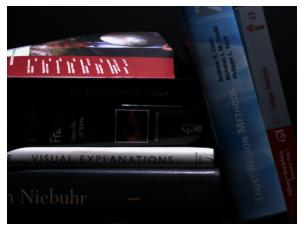

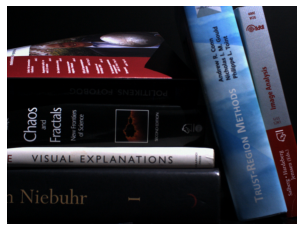

No. of Features Matched:  477


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/4.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))

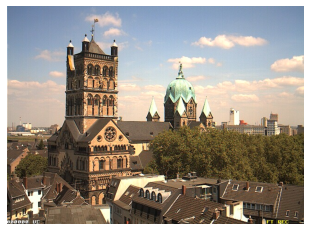

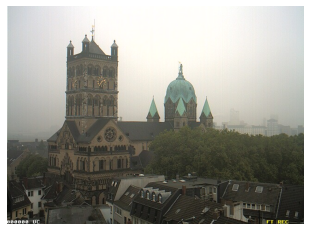

No. of Features Matched:  88


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_castle/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_castle/4.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))




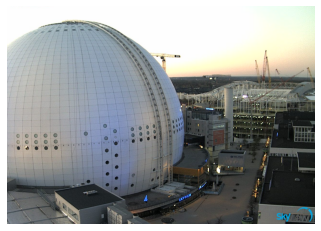

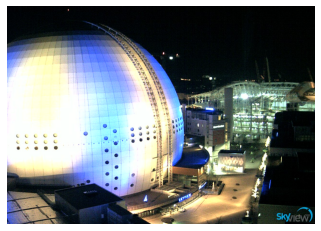

No. of Features Matched:  19


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/3.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))



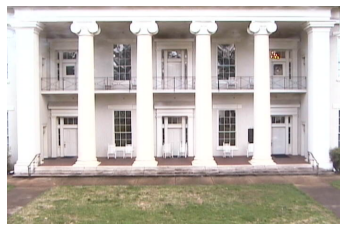

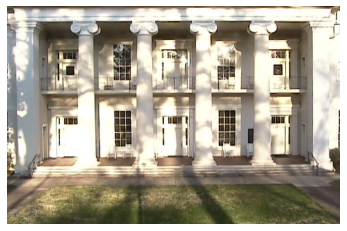

No. of Features Matched:  50


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))

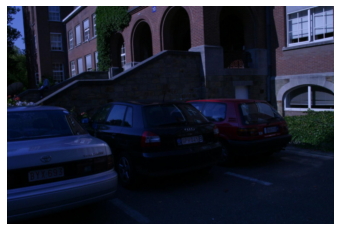

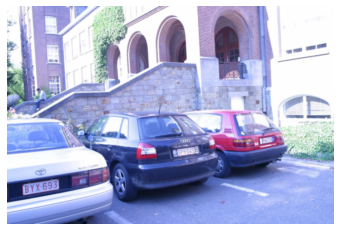

No. of Features Matched:  38


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/6.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))




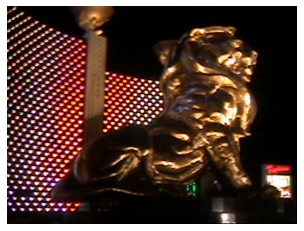

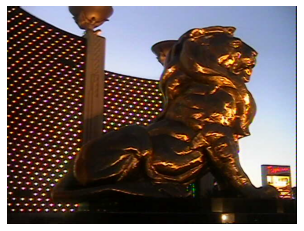

No. of Features Matched:  67


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_lionnight/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_lionnight/3.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))




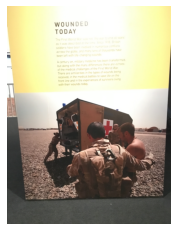

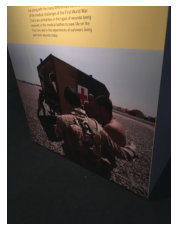

No. of Features Matched:  95


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wounded/2.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wounded/5.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


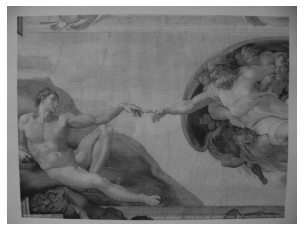

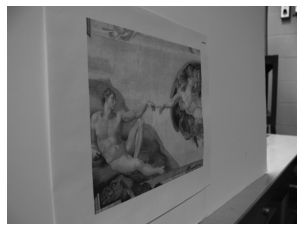

No. of Features Matched:  49


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_adam/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_adam/4.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


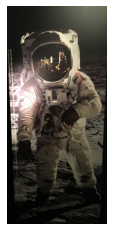

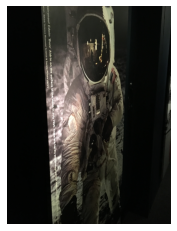

No. of Features Matched:  68


In [ ]:
img1 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/1.ppm'
img2 = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/5.ppm'

img = mpimg.imread(img1)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

img = mpimg.imread(img2)
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

print("No. of Features Matched: ", sift_feature_matching(img1, img2))


### Getting Upper Bound of the Score

In [ ]:
similar_images_score = []

In [ ]:
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_ajuntament/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_ajuntament/3.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/4.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_castle/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_castle/4.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_dome/3.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/6.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_lionnight/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_lionnight/3.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wounded/2.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_wounded/5.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_adam/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_adam/4.ppm"))
similar_images_score.append(sift_feature_matching("/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/1.ppm", "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/5.ppm"))


In [ ]:
print(similar_images_score)

[10, 477, 88, 19, 50, 38, 67, 95, 49, 68]


In [ ]:
lower_bound = (sum(similar_images_score))/(len(similar_images_score))
print(upper_bound)

96.1


### Part 2: Decreasing NoFM of Similar Images

In [ ]:
mean_imagenet = np.zeros([224, 224, 3])
mean_imagenet[...,0].fill(103.939)
mean_imagenet[...,1].fill(116.779)
mean_imagenet[...,2].fill(123.68)
model = ResNet50(weights='imagenet')
classifier = KerasClassifier(clip_values=(0, 255), model=model, preprocessing=(mean_imagenet, np.ones([224, 224, 3])))

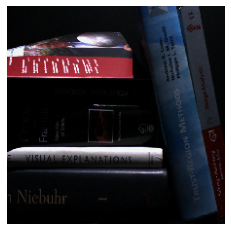

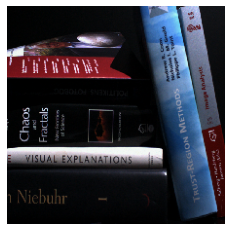

No. Of Matched Features:  477


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/4.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

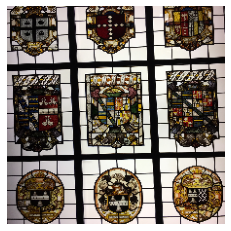

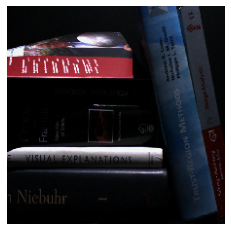

No. Of Matched Features:  5


In [ ]:
init_image_path = "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_vitro/1.ppm"
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/1.ppm"

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  church


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1504.41it/s]

Adversarial image at step 0. L2 error 50263.902 and class label 497.
I think this is a:  church


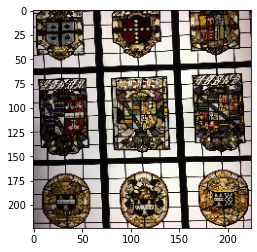

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.94s/it]


Adversarial image at step 10. L2 error 12324.4795 and class label 497.
I think this is a:  church


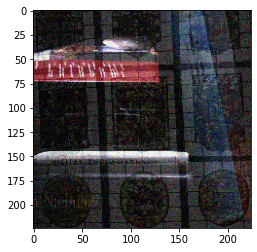

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:21<00:00, 21.62s/it]


Adversarial image at step 20. L2 error 11086.771 and class label 497.
I think this is a:  church


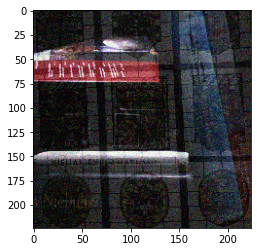

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:24<00:00, 24.96s/it]


Adversarial image at step 30. L2 error 9742.074 and class label 497.
I think this is a:  church


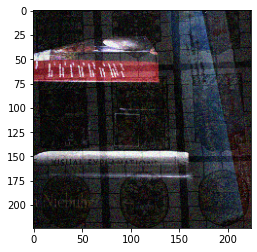

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:28<00:00, 28.41s/it]


Adversarial image at step 40. L2 error 8636.955 and class label 497.
I think this is a:  church


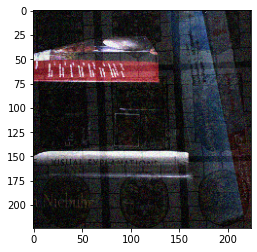

No. of Features Matched:  4


HopSkipJump: 100%|██████████| 1/1 [00:30<00:00, 30.47s/it]


Adversarial image at step 50. L2 error 7697.0483 and class label 497.
I think this is a:  church


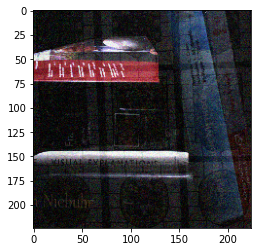

No. of Features Matched:  5


HopSkipJump: 100%|██████████| 1/1 [00:32<00:00, 32.75s/it]


Adversarial image at step 60. L2 error 5227.917 and class label 497.
I think this is a:  church


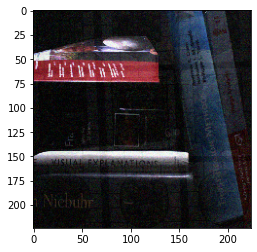

No. of Features Matched:  6


HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.99s/it]


Adversarial image at step 70. L2 error 4063.8765 and class label 497.
I think this is a:  church


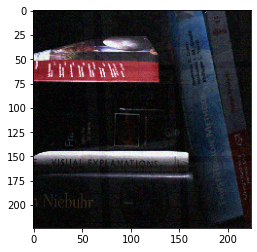

No. of Features Matched:  10


HopSkipJump: 100%|██████████| 1/1 [00:36<00:00, 36.78s/it]


Adversarial image at step 80. L2 error 3634.5254 and class label 497.
I think this is a:  church


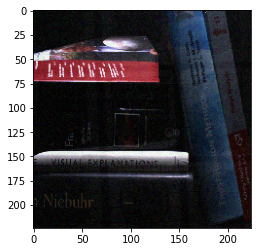

No. of Features Matched:  12


HopSkipJump: 100%|██████████| 1/1 [00:38<00:00, 38.87s/it]


Adversarial image at step 90. L2 error 2875.8755 and class label 497.
I think this is a:  church


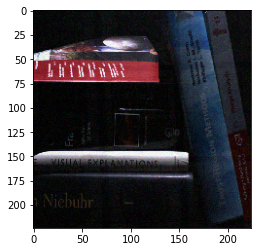

No. of Features Matched:  17


HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.81s/it]


Adversarial image at step 100. L2 error 2435.6936 and class label 497.
I think this is a:  church


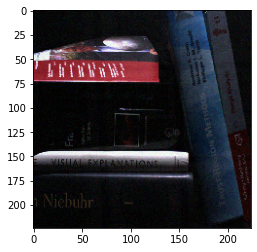

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [00:41<00:00, 41.81s/it]


Adversarial image at step 110. L2 error 2103.2322 and class label 497.
I think this is a:  church


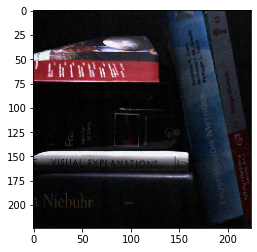

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [00:43<00:00, 43.52s/it]


Adversarial image at step 120. L2 error 1900.3766 and class label 497.
I think this is a:  church


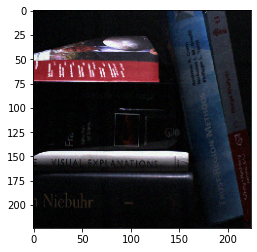

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [00:47<00:00, 47.03s/it]


Adversarial image at step 130. L2 error 1694.5161 and class label 497.
I think this is a:  church


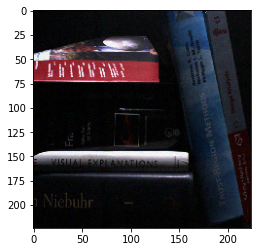

No. of Features Matched:  19


HopSkipJump: 100%|██████████| 1/1 [00:47<00:00, 47.68s/it]


Adversarial image at step 140. L2 error 1552.0151 and class label 497.
I think this is a:  church


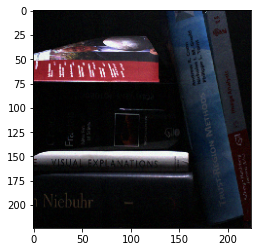

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [00:50<00:00, 50.71s/it]


Adversarial image at step 150. L2 error 1444.5771 and class label 497.
I think this is a:  church


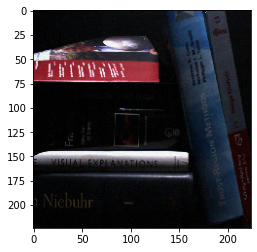

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [00:49<00:00, 49.80s/it]


Adversarial image at step 160. L2 error 1335.4937 and class label 497.
I think this is a:  church


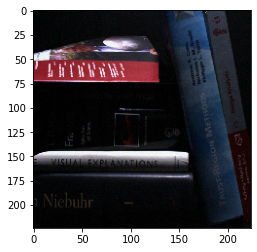

No. of Features Matched:  22


HopSkipJump: 100%|██████████| 1/1 [00:51<00:00, 51.11s/it]


Adversarial image at step 170. L2 error 1248.8685 and class label 497.
I think this is a:  church


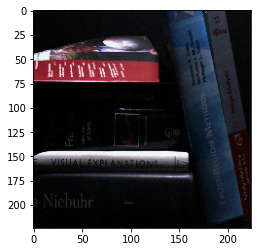

No. of Features Matched:  18


HopSkipJump: 100%|██████████| 1/1 [00:54<00:00, 54.33s/it]


Adversarial image at step 180. L2 error 1160.4 and class label 497.
I think this is a:  church


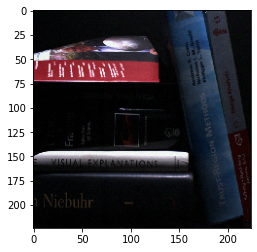

No. of Features Matched:  20


HopSkipJump: 100%|██████████| 1/1 [00:54<00:00, 54.93s/it]


Adversarial image at step 190. L2 error 1072.5476 and class label 497.
I think this is a:  church


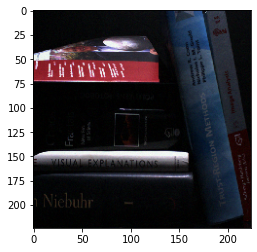

No. of Features Matched:  20


HopSkipJump: 100%|██████████| 1/1 [00:54<00:00, 54.96s/it]


Adversarial image at step 200. L2 error 1010.44006 and class label 497.
I think this is a:  church


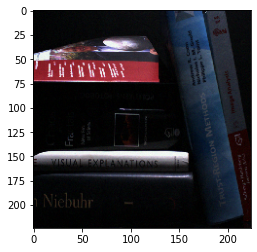

No. of Features Matched:  18


HopSkipJump: 100%|██████████| 1/1 [00:57<00:00, 57.38s/it]


Adversarial image at step 210. L2 error 948.485 and class label 497.
I think this is a:  church


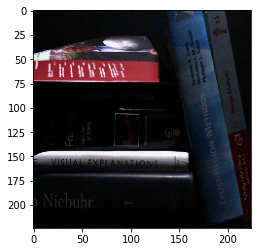

No. of Features Matched:  19


HopSkipJump: 100%|██████████| 1/1 [00:57<00:00, 57.17s/it]


Adversarial image at step 220. L2 error 890.4975 and class label 497.
I think this is a:  church


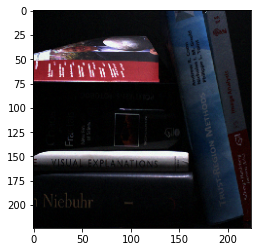

No. of Features Matched:  19


HopSkipJump: 100%|██████████| 1/1 [00:58<00:00, 58.37s/it]


Adversarial image at step 230. L2 error 843.3608 and class label 497.
I think this is a:  church


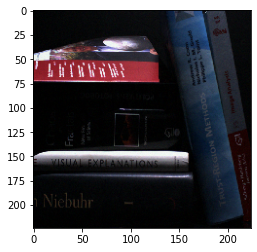

No. of Features Matched:  19


HopSkipJump: 100%|██████████| 1/1 [00:59<00:00, 59.29s/it]


Adversarial image at step 240. L2 error 814.3838 and class label 497.
I think this is a:  church


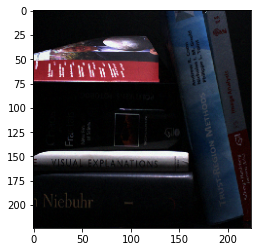

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [01:00<00:00, 60.38s/it]


Adversarial image at step 250. L2 error 775.0698 and class label 497.
I think this is a:  church


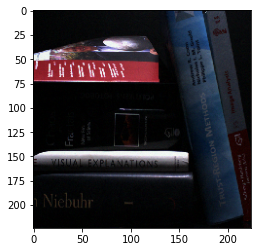

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [01:01<00:00, 61.60s/it]


Adversarial image at step 260. L2 error 738.93365 and class label 497.
I think this is a:  church


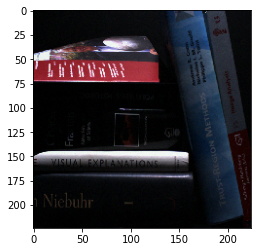

No. of Features Matched:  17


HopSkipJump: 100%|██████████| 1/1 [01:02<00:00, 62.76s/it]


Adversarial image at step 270. L2 error 709.2795 and class label 497.
I think this is a:  church


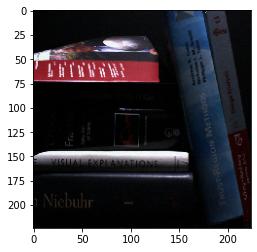

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [01:03<00:00, 63.58s/it]


Adversarial image at step 280. L2 error 675.04535 and class label 497.
I think this is a:  church


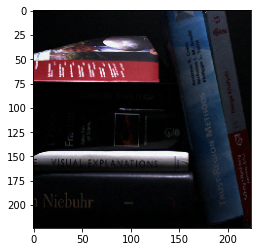

No. of Features Matched:  22


HopSkipJump: 100%|██████████| 1/1 [01:04<00:00, 64.17s/it]


Adversarial image at step 290. L2 error 649.30035 and class label 497.
I think this is a:  church


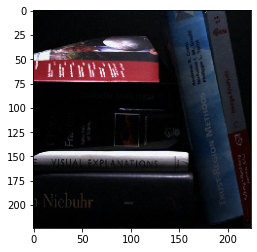

No. of Features Matched:  22


HopSkipJump: 100%|██████████| 1/1 [01:05<00:00, 65.53s/it]


Adversarial image at step 300. L2 error 622.08777 and class label 497.
I think this is a:  church


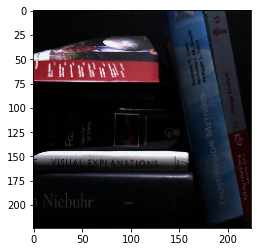

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [01:06<00:00, 66.18s/it]


Adversarial image at step 310. L2 error 600.71466 and class label 497.
I think this is a:  church


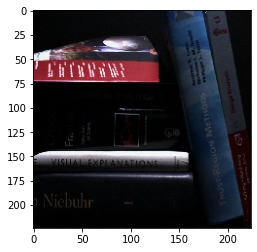

No. of Features Matched:  21


HopSkipJump: 100%|██████████| 1/1 [01:08<00:00, 68.18s/it]


Adversarial image at step 320. L2 error 581.2351 and class label 497.
I think this is a:  church


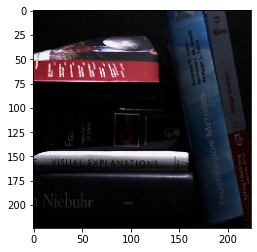

No. of Features Matched:  22


HopSkipJump: 100%|██████████| 1/1 [01:09<00:00, 69.69s/it]


Adversarial image at step 330. L2 error 558.902 and class label 497.
I think this is a:  church


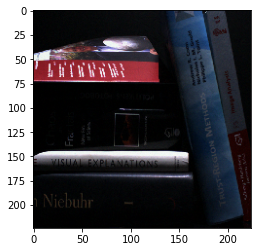

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [01:10<00:00, 70.06s/it]


Adversarial image at step 340. L2 error 542.60223 and class label 497.
I think this is a:  church


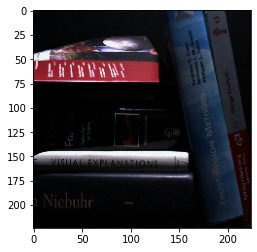

No. of Features Matched:  26


HopSkipJump: 100%|██████████| 1/1 [01:10<00:00, 70.49s/it]


Adversarial image at step 350. L2 error 526.5351 and class label 497.
I think this is a:  church


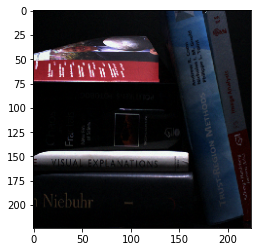

No. of Features Matched:  23


HopSkipJump: 100%|██████████| 1/1 [01:11<00:00, 71.72s/it]


Adversarial image at step 360. L2 error 509.97342 and class label 497.
I think this is a:  church


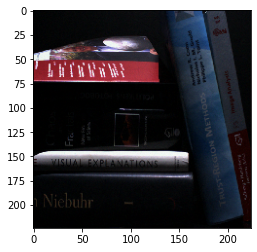

No. of Features Matched:  25


HopSkipJump:   0%|          | 0/1 [00:46<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_books/4.ppm") <=4 and i>=10):
            break

        i+=1

As the number of features matched before the attack were way too high in the above scenario, therefore it is way too dificult to reduce it to the lower bound.

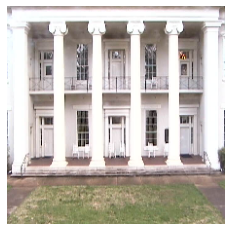

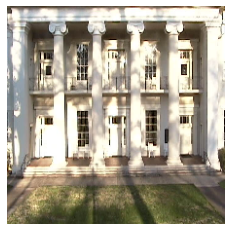

No. Of Matched Features:  50


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

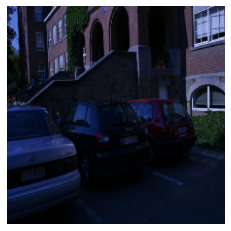

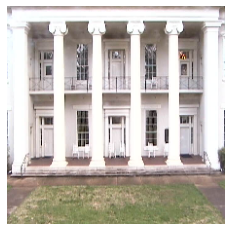

No. Of Matched Features:  4


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  cab


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1633.93it/s]

Adversarial image at step 0. L2 error 63801.47 and class label 468.
I think this is a:  cab


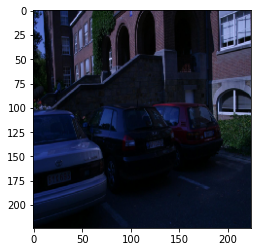

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:20<00:00, 20.07s/it]


Adversarial image at step 10. L2 error 59732.39 and class label 468.
I think this is a:  cab


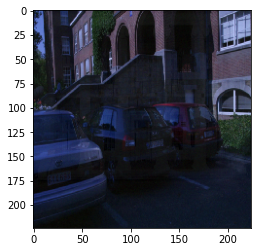

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:23<00:00, 23.16s/it]


Adversarial image at step 20. L2 error 57220.438 and class label 468.
I think this is a:  cab


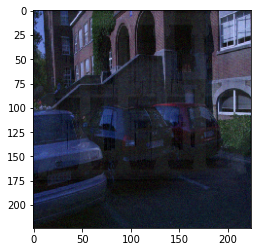

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:26<00:00, 26.79s/it]


Adversarial image at step 30. L2 error 52415.36 and class label 468.
I think this is a:  cab


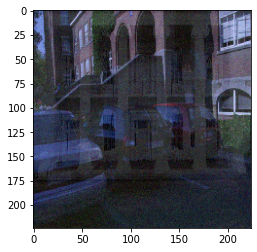

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:29<00:00, 29.90s/it]


Adversarial image at step 40. L2 error 47560.426 and class label 468.
I think this is a:  cab


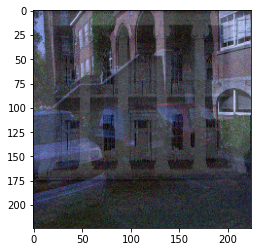

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:32<00:00, 32.08s/it]


Adversarial image at step 50. L2 error 41121.06 and class label 468.
I think this is a:  cab


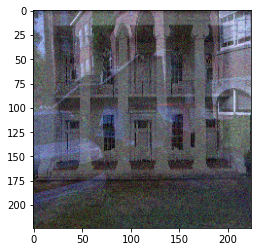

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:33<00:00, 33.75s/it]


Adversarial image at step 60. L2 error 36337.613 and class label 468.
I think this is a:  cab


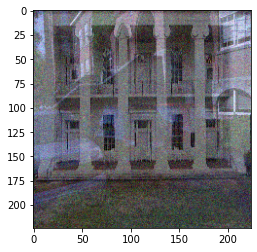

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:36<00:00, 36.22s/it]


Adversarial image at step 70. L2 error 32328.848 and class label 468.
I think this is a:  cab


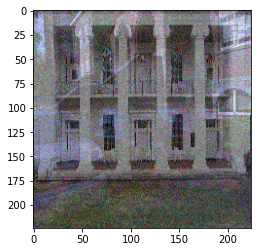

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:38<00:00, 38.80s/it]


Adversarial image at step 80. L2 error 28729.842 and class label 468.
I think this is a:  cab


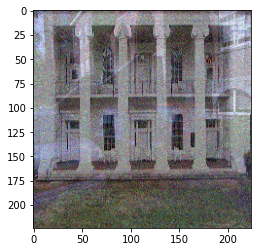

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.48s/it]


Adversarial image at step 90. L2 error 24390.719 and class label 468.
I think this is a:  cab


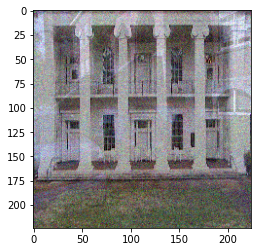

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:41<00:00, 41.82s/it]


Adversarial image at step 100. L2 error 20758.277 and class label 468.
I think this is a:  cab


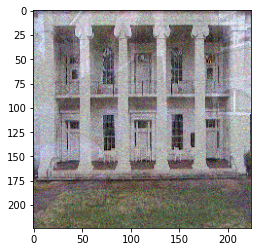

No. of Features Matched:  0


In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm") <=4 and i>=10):
            break

        i+=1

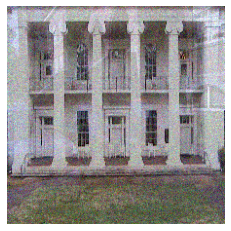

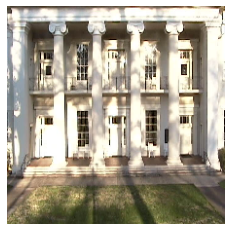

No. of Features Matched:  0


0

In [ ]:
plt.imshow(x_adv[0].astype(np.uint))
plt.axis('off')
plt.show()

image2 = "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm"

target_image = image.load_img(image2, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()


match(x_adv, image2)


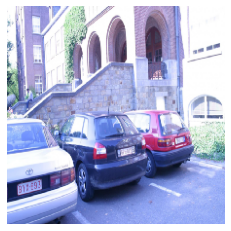

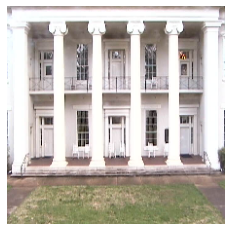

No. Of Matched Features:  4


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_leuven/6.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/1.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  cab


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1257.29it/s]

Adversarial image at step 0. L2 error 32425.39 and class label 468.
I think this is a:  cab


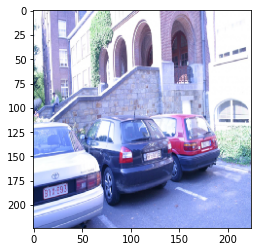

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.45s/it]


Adversarial image at step 10. L2 error 28144.945 and class label 468.
I think this is a:  cab


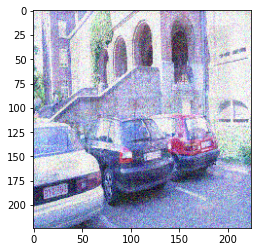

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:21<00:00, 21.85s/it]


Adversarial image at step 20. L2 error 24487.076 and class label 468.
I think this is a:  cab


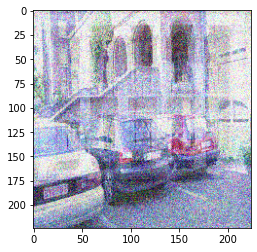

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:27<00:00, 27.34s/it]


Adversarial image at step 30. L2 error 18551.533 and class label 468.
I think this is a:  cab


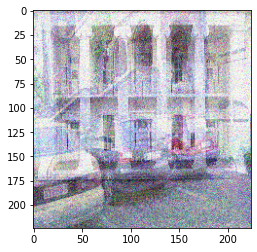

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:29<00:00, 29.90s/it]


Adversarial image at step 40. L2 error 17198.795 and class label 468.
I think this is a:  cab


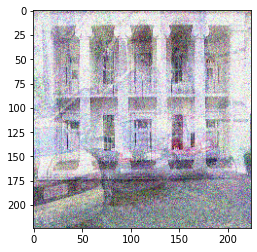

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:34<00:00, 34.81s/it]


Adversarial image at step 50. L2 error 15085.5205 and class label 468.
I think this is a:  cab


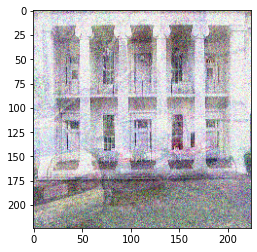

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:36<00:00, 36.01s/it]


Adversarial image at step 60. L2 error 13028.36 and class label 468.
I think this is a:  cab


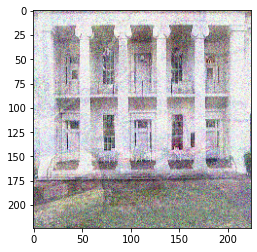

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.10s/it]


Adversarial image at step 70. L2 error 10767.907 and class label 468.
I think this is a:  cab


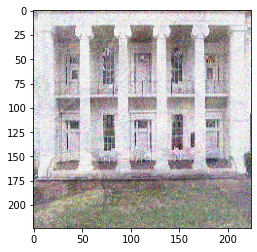

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:39<00:00, 39.82s/it]


Adversarial image at step 80. L2 error 9346.636 and class label 468.
I think this is a:  cab


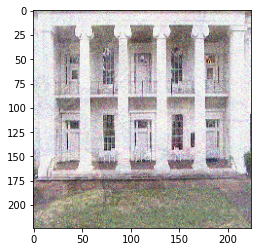

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.56s/it]


Adversarial image at step 90. L2 error 7520.891 and class label 468.
I think this is a:  cab


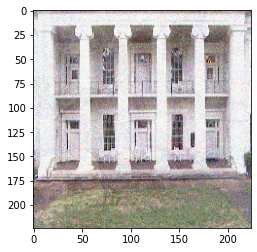

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:42<00:00, 42.28s/it]


Adversarial image at step 100. L2 error 5921.5527 and class label 468.
I think this is a:  cab


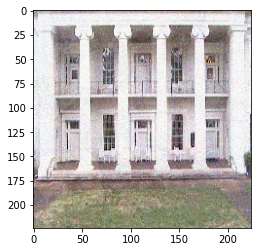

No. of Features Matched:  0


In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm") <=4 and i>=10):
            break

        i+=1

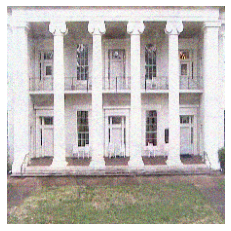

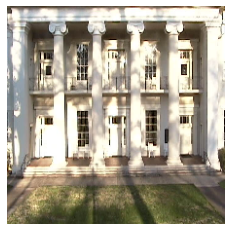

No. of Features Matched:  0


0

In [ ]:
plt.imshow(x_adv[0].astype(np.uint))
plt.axis('off')
plt.show()

image2 = "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/i_kions/6.ppm"

target_image = image.load_img(image2, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()


match(x_adv, image2)


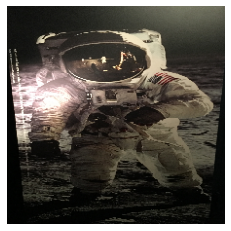

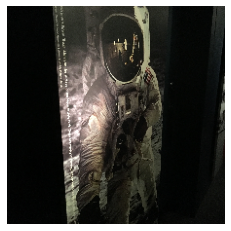

No. Of Matched Features:  68


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/5.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

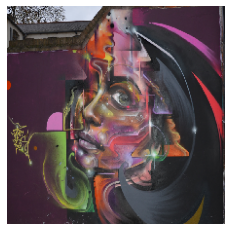

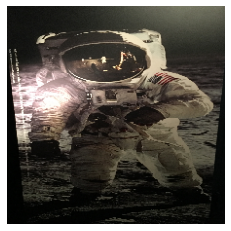

No. Of Matched Features:  4


In [ ]:
init_image_path = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_woman/1.ppm'
init_image = image.load_img(init_image_path, target_size=(224, 224))
init_image = image.img_to_array(init_image)

plt.imshow(init_image.astype(np.uint))
plt.axis('off')
plt.show()


target_image_name = '/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/1.ppm'

target_image = image.load_img(target_image_name, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()

print("No. Of Matched Features: ", sift_feature_matching(init_image_path, target_image_name))

initial_prediction:  scuba_diver


HopSkipJump: 100%|██████████| 1/1 [00:00<00:00, 1253.90it/s]

Adversarial image at step 0. L2 error 28783.963 and class label 983.
I think this is a:  scuba_diver


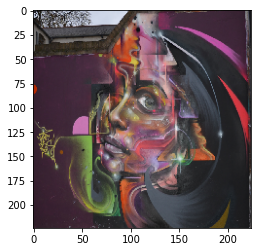

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:15<00:00, 15.64s/it]


Adversarial image at step 10. L2 error 17074.438 and class label 983.
I think this is a:  scuba_diver


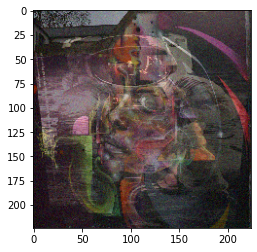

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:21<00:00, 21.98s/it]


Adversarial image at step 20. L2 error 15651.797 and class label 983.
I think this is a:  scuba_diver


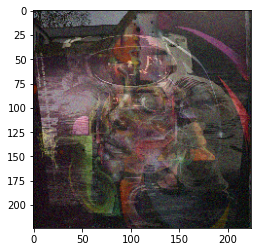

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:24<00:00, 24.71s/it]


Adversarial image at step 30. L2 error 11180.907 and class label 983.
I think this is a:  scuba_diver


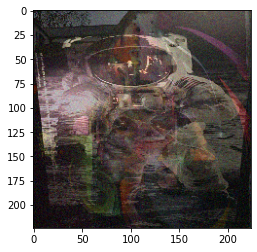

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:27<00:00, 27.95s/it]


Adversarial image at step 40. L2 error 6751.6196 and class label 983.
I think this is a:  scuba_diver


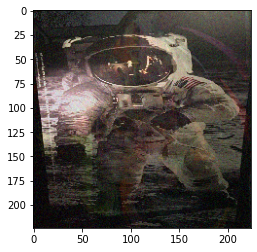

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:32<00:00, 32.09s/it]


Adversarial image at step 50. L2 error 4281.9717 and class label 983.
I think this is a:  scuba_diver


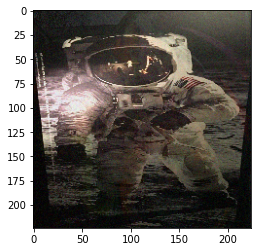

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.17s/it]


Adversarial image at step 60. L2 error 3080.5708 and class label 983.
I think this is a:  scuba_diver


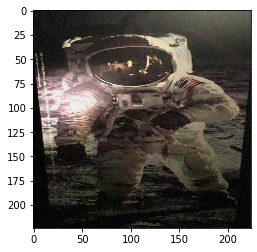

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:35<00:00, 35.15s/it]


Adversarial image at step 70. L2 error 2393.722 and class label 983.
I think this is a:  scuba_diver


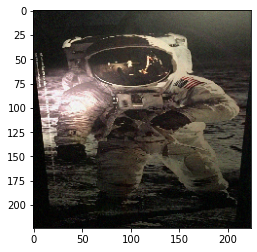

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:37<00:00, 37.27s/it]


Adversarial image at step 80. L2 error 1961.0132 and class label 983.
I think this is a:  scuba_diver


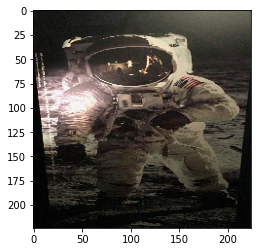

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:40<00:00, 40.44s/it]


Adversarial image at step 90. L2 error 1626.8737 and class label 983.
I think this is a:  scuba_diver


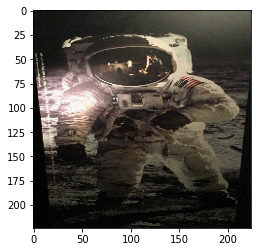

No. of Features Matched:  0


HopSkipJump: 100%|██████████| 1/1 [00:42<00:00, 42.09s/it]


Adversarial image at step 100. L2 error 1311.3864 and class label 983.
I think this is a:  scuba_diver


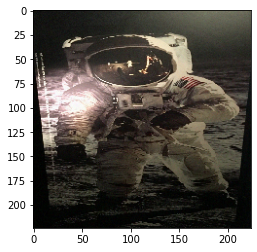

No. of Features Matched:  0


In [ ]:
with tf.device('/GPU:0'):

    attack = HopSkipJump(classifier=classifier, targeted=True, max_iter=0, max_eval=1000, init_eval=10)
    iter_step = 10

    x_adv = np.array([init_image])

    pred = classifier.predict(x_adv)

    #get initial label for HopSkip to compare
    initial_label = np.argmax(pred[0])

    print("initial_prediction: ",decode_predictions(pred, top=1)[0][0][1])

    i=0

    while True:
        x_adv = attack.generate(x=np.array([target_image]), y=to_categorical([initial_label], 1000), x_adv_init=x_adv, resume=True)

        #clear_output()
        pred = classifier.predict(x_adv)
        print("Adversarial image at step %d." % (i * iter_step), "L2 error",
              np.linalg.norm(np.reshape(x_adv[0] - target_image, [-1])),
              "and class label %d." % np.argmax(pred[0]))
        print("I think this is a: ",decode_predictions(pred, top=1)[0][0][1])
        plt.imshow(x_adv[0].astype(np.uint))
        plt.show(block=False)

        attack.max_iter = iter_step

#         print(match(x_adv, init_image_path))

        if(match(x_adv, "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/5.ppm") <=4 and i>=10):
            break

        i+=1

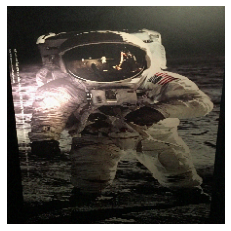

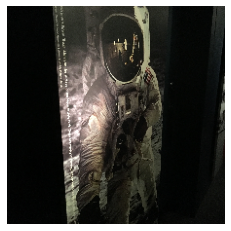

No. of Features Matched:  0


0

In [ ]:
plt.imshow(x_adv[0].astype(np.uint))
plt.axis('off')
plt.show()

image2 = "/home/romi/Desktop/Muhammad_Hashir/hsja_hpatches/hpatches-sequences-release/v_astronautis/5.ppm"

target_image = image.load_img(image2, target_size=(224, 224))
target_image = image.img_to_array(target_image)

plt.imshow(target_image.astype(np.uint))
plt.axis('off')
plt.show()


match(x_adv, image2)
